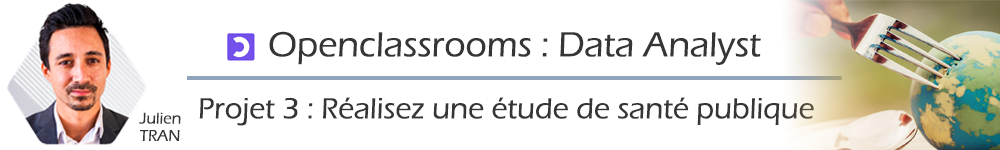

Créez un dataframe contenant les informations de population de chaque pays. Calculez le nombre total d’humains sur la planète. Critiquez votre résultat. En cas d’anomalie, analysez et effectuer les corrections nécessaires.

### Question 1 : donnez le résultat de votre calcul pour l'année 2013

Parmi les documents sur les Bilans alimentaires que vous avez téléchargés, il y a des informations redondantes. En effet, pour un pays donné, certaines de ces informations peuvent se calculer à partir d'autres :

Production/ Importations/ Exportations/ Variation de stock/ Disponibilité intérieure/ Semences/ Pertes/ Nourriture, aussi appelée Disponibilité alimentaire/ Aliments pour animaux/ Traitement/ Autres utilisations 

### Question 2 : Identifiez ces redondances, en donnant votre réponse sous forme de formule mathématique. Faire intervenir chacune des 11 quantités données ci dessus. Illustrez cette équation avec l'exemple du blé en France

A partir de ces informations :

Population de chaque pays ;
Disponibilité alimentaire donnée pour chaque produit et pour chaque pays en kcal/personne/jour.
Disponibilité alimentaire en protéines donnée pour chaque produit et pour chaque pays en g/personne/jour.

### Question 3 : Calculez (pour chaque pays et chaque produit) la disponibilité alimentaire en kcal puis en kg de protéines

### Question 4 : A partir de ces dernières informations, et à partir du poids de la disponibilité alimentaire (pour chaque pays et chaque produit), calculez pour chaque produit le ratio "énergie/poids", que vous donnerez en kcal/kg. 

Vous pouvez vérifier la cohérence de votre calcul en comparant ce ratio aux données disponibles sur internet, par exemple en cherchant la valeur calorique d'un oeuf.

### Question 5 : Citez 5 aliments parmi les 20 aliments les plus caloriques, en utilisant le ratio énergie/poids.

Étonnamment, il arrive que ce ratio soit différent en fonction du pays. Il faudra donc réaliser pour chaque aliment une moyenne sur les différents pays. Vous créerez donc une nouvelle table grâce à une agrégation. Attention à bien retirer les valeurs égales à 0 afin de ne pas fausser le calcul de la moyenne.

### Citez 5 aliments parmi les 20 aliments les plus riches en protéines.

### Question 6 : Calculez, pour les produits végétaux uniquement, la disponibilité intérieure mondiale exprimée en kcal.

### Sommaire // Question 1-5 🍌

* [1.Importation des librairies et parametres df](#1)
* [2.Importation des fichiers CSV](#2)
* [3.Nettoyage des différentes tables](#3)
    * [3.1.Population](#3.1)
        * [3.1.1.Valeurs manquantes, nulles et NA](#3.1.1)
        * [3.1.2.Doublons](#3.1.2)
        * [3.1.3.Q1_Population totale en 2013](#3.1.3)
    * [3.2.Vegetaux](#3.2)
        * [3.2.1.Valeurs manquantes, nulles et NA](#3.2.1)
        * [3.2.2.Doublons](#3.2.2)
        * [3.2.3.Q2_Disponibilité intérieure](#3.2.3)
    * [3.3.Animaux](#3.3)
        * [3.3.1.Valeurs manquantes, nulles et NA](#3.3.1)
        * [3.3.2.Doublons](#3.3.2)
* [4.Manipulations des tables pour Q3](#4)
    * [4.1.Concatenation des tables vegetaux et animaux](#4.1)
    * [4.2.Jointure des tables vegetaux_animaux et population](#4.2)
    * [4.3.Table Q3](#4.3)
* [5.Manipulations des tables pour Q4](#5)
    * [5.1.Table Q4](#5.1)
* [6.Manipulations des tables pour Q5](#6)
    * [6.1.Table Q5_1](#6.1)
    * [6.1.Table Q5_2](#6.2)

## 1.Importation des librairies et parametres df <a class="anchor" id="1"></a>

In [1]:
#j'importe les librairies qui vont me servir plus tard
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## 2.Importation des fichiers CSV <a class="anchor" id="2"></a>

In [2]:
#Je charge tous les fichiers csv
population = pd.read_csv("C:/Users/33643/Desktop/P3/FAO_2013_fr/fr_population.csv")
animaux = pd.read_csv("C:/Users/33643/Desktop/P3/FAO_2013_fr/fr_animaux.csv")
céréales = pd.read_csv("C:/Users/33643/Desktop/P3/FAO_2013_fr/fr_céréales.csv")
sousalimentation = pd.read_csv("C:/Users/33643/Desktop/P3/FAO_2013_fr/fr_sousalimentation.csv")
vegetaux = pd.read_csv("C:/Users/33643/Desktop/P3/FAO_2013_fr/fr_vegetaux.csv")

#J'affiche une phrase si l'import est reussi
print("Fichiers chargés avec succes!") 

Fichiers chargés avec succes!


## 3.Nettoyage des différentes tables <a class="anchor" id="3"></a>

## 3.1.Population <a class="anchor" id="3.1"></a>

In [3]:
#Je jette un coup d'oeil aux 5 premieres lignes du fichier
population.head() 

,Code Domaine,Domaine,Code zone,Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole
0,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,511,Population totale,2501,Population,2013,2013,1000 personnes,30552,NaN,Donnée officielle
1,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,202,Afrique du Sud,511,Population totale,2501,Population,2013,2013,1000 personnes,52776,NaN,Donnée officielle
2,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,3,Albanie,511,Population totale,2501,Population,2013,2013,1000 personnes,3173,NaN,Donnée officielle
3,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,4,Algérie,511,Population totale,2501,Population,2013,2013,1000 personnes,39208,NaN,Donnée officielle
4,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,79,Allemagne,511,Population totale,2501,Population,2013,2013,1000 personnes,82727,NaN,Donnée officielle


In [4]:
#Je jette un coup d'oeil aux total, moyenne, écrat min, min, max pour toutes les lignes
population.describe()  

,Code zone,Code Élément,Code Produit,Code année,Année,Valeur
count,175.000000,175.0,175.0,175.0,175.0,1.750000e+02
mean,126.720000,511.0,2501.0,2013.0,2013.0,4.807996e+04
std,75.168519,0.0,0.0,0.0,0.0,1.786327e+05
min,1.000000,511.0,2501.0,2013.0,2013.0,5.400000e+01
25%,64.500000,511.0,2501.0,2013.0,2013.0,2.543500e+03
50%,121.000000,511.0,2501.0,2013.0,2013.0,9.413000e+03
75%,188.500000,511.0,2501.0,2013.0,2013.0,2.888150e+04
max,351.000000,511.0,2501.0,2013.0,2013.0,1.416667e+06


In [5]:
#Je vérifie le nombre de colonnes et lignes
population.shape 

(175, 14)

In [6]:
#Je vérifie le nombre de valeur unique dans la colonne Valeur
len(population['Valeur'].unique()) 

175

In [7]:
#Je definis le nombre de lignes max affichées sur aucune limite
pd.set_option("max_rows", None) 

## 3.1.1.Valeurs manquantes, nulles et NA <a class="anchor" id="3.1.1"></a>

In [8]:
#Je trie la table par ordre croissant de la colonne Valeur et je drop les colonnes NaN

population.sort_values(by = 'Valeur').dropna(axis=1)

,Code Domaine,Domaine,Code zone,Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Description du Symbole
143,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,188,Saint-Kitts-et-Nevis,511,Population totale,2501,Population,2013,2013,1000 personnes,54,Donnée officielle
20,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,17,Bermudes,511,Population totale,2501,Population,2013,2013,1000 personnes,65,Donnée officielle
47,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,55,Dominique,511,Population totale,2501,Population,2013,2013,1000 personnes,72,Donnée officielle
6,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,8,Antigua-et-Barbuda,511,Population totale,2501,Population,2013,2013,1000 personnes,90,Donnée officielle
89,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,83,Kiribati,511,Population totale,2501,Population,2013,2013,1000 personnes,102,Donnée officielle
66,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,86,Grenade,511,Population totale,2501,Population,2013,2013,1000 personnes,106,Donnée officielle
144,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,191,Saint-Vincent-et-les Grenadines,511,Population totale,2501,Population,2013,2013,1000 personnes,109,Donnée officielle
142,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,189,Sainte-Lucie,511,Population totale,2501,Population,2013,2013,1000 personnes,182,Donnée officielle
145,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,244,Samoa,511,Population totale,2501,Population,2013,2013,1000 personnes,190,Donnée officielle
146,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,193,Sao Tomé-et-Principe,511,Population totale,2501,Population,2013,2013,1000 personnes,193,Donnée officielle


#### J'ai remarqué en fin de table que la population totale de la chine etait compté deux fois.

In [9]:
print(population.isnull().values.any())
print(population.isnull().sum())

True
Code Domaine                0
Domaine                     0
Code zone                   0
Zone                        0
Code Élément                0
Élément                     0
Code Produit                0
Produit                     0
Code année                  0
Année                       0
Unité                       0
Valeur                      0
Symbole                   174
Description du Symbole      0
dtype: int64


## 3.1.2.Doublons <a class="anchor" id="3.1.2"></a>

In [10]:
print(population.duplicated().values.any())

False


In [11]:
#Je supprime la ligne doublon que j'ai repéré dans la table
population_sschine = population[population.Zone != 'Chine']

#J'en profite pour completer le nettoyage de la table, pour plus tard
population = population_sschine.drop(columns =['Code Domaine','Domaine','Code zone','Code Élément','Code Produit','Année','Code année','Unité','Symbole','Description du Symbole'])
population = population.rename(columns ={'Valeur':'Nbr habitants'})
population['Nbr habitants'] = population['Nbr habitants']*1000

population.head(5)

,Zone,Élément,Produit,Nbr habitants
0,Afghanistan,Population totale,Population,30552000
1,Afrique du Sud,Population totale,Population,52776000
2,Albanie,Population totale,Population,3173000
3,Algérie,Population totale,Population,39208000
4,Allemagne,Population totale,Population,82727000


## 3.1.3.Q1_Population totale en 2013 <a class="anchor" id="3.1.3"></a>

In [12]:
#Je calcule la somme de la colonne Valeur pour obtenir le nombre total de personnes
total_population = population['Nbr habitants'].sum()
print ('La population totale en 2013 est de', total_population, 'personnes') 

La population totale en 2013 est de 6997326000 personnes


## 3.2.Vegetaux <a class="anchor" id="3.2"></a>

In [13]:
#Je jette un coup d'oeil aux 5 premieres lignes du fichier
vegetaux.head() 

,Code Domaine,Domaine,Code zone,Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole
0,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,5511,Production,2511,Blé,2013,2013,Milliers de tonnes,5169.0,S,Données standardisées
1,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,5611,Importations - Quantité,2511,Blé,2013,2013,Milliers de tonnes,1173.0,S,Données standardisées
2,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,5072,Variation de stock,2511,Blé,2013,2013,Milliers de tonnes,-350.0,S,Données standardisées
3,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,5301,Disponibilité intérieure,2511,Blé,2013,2013,Milliers de tonnes,5992.0,S,Données standardisées
4,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,5527,Semences,2511,Blé,2013,2013,Milliers de tonnes,322.0,S,Données standardisées


In [14]:
#Je calcule le nombre d'éléments uniques dans la colonne Element de la table animaux
len((vegetaux)['Élément'].unique()) 

15

In [15]:
#Je liste le nombre d'éléments uniques dans la colonne Element de la table vegetaux
(vegetaux)['Élément'].unique() 

array(['Production', 'Importations - Quantité', 'Variation de stock',
       'Disponibilité intérieure', 'Semences', 'Pertes', 'Nourriture',
       'Disponibilité alimentaire en quantité (kg/personne/an)',
       'Disponibilité alimentaire (Kcal/personne/jour)',
       'Disponibilité de protéines en quantité (g/personne/jour)',
       'Disponibilité de matière grasse en quantité (g/personne/jour)',
       'Aliments pour animaux', 'Exportations - Quantité', 'Traitement',
       'Autres utilisations (non alimentaire)'], dtype=object)

In [16]:
#Je vérifie le nombre de colonnes et lignes
vegetaux.shape

(104871, 14)

In [17]:
#Je supprime la ligne doublon que j'ai repéré dans la table
vegetaux_sschine = vegetaux[vegetaux.Zone != 'Chine']
vegetaux = vegetaux_sschine

## 3.2.1.Valeurs manquantes, nulles et NA <a class="anchor" id="3.2.1"></a>

In [18]:
print(vegetaux.isnull().values.any())

False


## 3.2.2.Doublons <a class="anchor" id="3.2.2"></a>

In [19]:
print(vegetaux.duplicated().values.any())

False


## 3.2.3.Q2_Disponibilité intérieure <a class="anchor" id="3.2.3"></a>

In [20]:
#Je localise les lignes et colonnes qui m'interessent
vegetaux_q2 = vegetaux.loc[(vegetaux['Zone'] == 'France') & (vegetaux['Produit'] == 'Blé'),["Élément","Valeur"]]
vegetaux_q2.head()

,Élément,Valeur
37487,Production,38614.0
37488,Importations - Quantité,2055.0
37489,Variation de stock,1131.0
37490,Exportations - Quantité,21502.0
37491,Disponibilité intérieure,20298.0


In [21]:
#Je calcule ma disponibilité intérieur de 3 facons differentes grace à l'équation suivante:
#Disponibilité intérieure = Production + importation + variation de stock - exportation = nourriture + pertes + aliments pour animaux + traitement + semences + autres utilisations

print("La disponibilité intérieure pour le blé en France en 2013 est de")

print(vegetaux_q2.iloc[4,1],"milliers de tonnes")
print((vegetaux_q2.iloc[1,1]) + (vegetaux_q2.iloc[0,1]) - (vegetaux_q2.iloc[3,1]) + (vegetaux_q2.iloc[2,1]),"milliers de tonnes")
print((vegetaux_q2.iloc[10,1]) + (vegetaux_q2.iloc[7,1]) + (vegetaux_q2.iloc[5,1]) + (vegetaux_q2.iloc[8,1]) + (vegetaux_q2.iloc[6,1]) + (vegetaux_q2.iloc[9,1]),"milliers de tonnes")

La disponibilité intérieure pour le blé en France en 2013 est de
20298.0 milliers de tonnes
20298.0 milliers de tonnes
20298.0 milliers de tonnes


## 3.3.Animaux <a class="anchor" id="3.3"></a>

In [22]:
animaux.head()

,Code Domaine,Domaine,Code zone,Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole
0,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,5511,Production,2731,Viande de Bovins,2013,2013,Milliers de tonnes,134.00,S,Données standardisées
1,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,5611,Importations - Quantité,2731,Viande de Bovins,2013,2013,Milliers de tonnes,6.00,S,Données standardisées
2,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,5301,Disponibilité intérieure,2731,Viande de Bovins,2013,2013,Milliers de tonnes,140.00,S,Données standardisées
3,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,5142,Nourriture,2731,Viande de Bovins,2013,2013,Milliers de tonnes,140.00,S,Données standardisées
4,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,645,Disponibilité alimentaire en quantité (kg/pers...,2731,Viande de Bovins,2013,2013,kg,4.59,Fc,Donnée calculée


In [23]:
#Je vérifie le nombre de colonnes et lignes
animaux.shape

(37166, 14)

In [24]:
#Je supprime la ligne doublon que j'ai repéré dans la table
animaux_sschine = animaux[animaux.Zone != 'Chine']
animaux = animaux_sschine

## 3.3.1.Valeurs manquantes, nulles et NA <a class="anchor" id="3.3.1"></a>

In [25]:
print(animaux.isnull().values.any())

False


## 3.3.2.Doublons <a class="anchor" id="3.3.2"></a>

In [26]:
print(animaux.duplicated().values.any())

False


## 4.Manipulations des tables pour Q3 <a class="anchor" id="4"></a>

## 4.1.Concatenation des tables vegetaux et animaux <a class="anchor" id="4.1"></a>

In [27]:
#Je concatene les tables animaux et vegetaux, elles contiennent des informations complémentaires
animaux_vegetaux = pd.concat([animaux, vegetaux])
animaux_vegetaux.head()

,Code Domaine,Domaine,Code zone,Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole
0,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,5511,Production,2731,Viande de Bovins,2013,2013,Milliers de tonnes,134.00,S,Données standardisées
1,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,5611,Importations - Quantité,2731,Viande de Bovins,2013,2013,Milliers de tonnes,6.00,S,Données standardisées
2,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,5301,Disponibilité intérieure,2731,Viande de Bovins,2013,2013,Milliers de tonnes,140.00,S,Données standardisées
3,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,5142,Nourriture,2731,Viande de Bovins,2013,2013,Milliers de tonnes,140.00,S,Données standardisées
4,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,645,Disponibilité alimentaire en quantité (kg/pers...,2731,Viande de Bovins,2013,2013,kg,4.59,Fc,Donnée calculée


In [28]:
#Je vérifie le nombre de colonnes et lignes
animaux_vegetaux.shape

(140919, 14)

## 4.2.Jointure des tables vegetaux_animaux et population <a class="anchor" id="4.2"></a>

In [29]:
#Je merge les tables animaux_vegetaux et population
animaux_vegetaux_pop = pd.merge(animaux_vegetaux, population[['Zone','Nbr habitants']], on= 'Zone', how= 'inner')                                                                
animaux_vegetaux_pop.head()

,Code Domaine,Domaine,Code zone,Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole,Nbr habitants
0,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,5511,Production,2731,Viande de Bovins,2013,2013,Milliers de tonnes,134.00,S,Données standardisées,30552000
1,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,5611,Importations - Quantité,2731,Viande de Bovins,2013,2013,Milliers de tonnes,6.00,S,Données standardisées,30552000
2,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,5301,Disponibilité intérieure,2731,Viande de Bovins,2013,2013,Milliers de tonnes,140.00,S,Données standardisées,30552000
3,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,5142,Nourriture,2731,Viande de Bovins,2013,2013,Milliers de tonnes,140.00,S,Données standardisées,30552000
4,FBSH,Bilans Alimentaire (Ancienne méthodologie et p...,2,Afghanistan,645,Disponibilité alimentaire en quantité (kg/pers...,2731,Viande de Bovins,2013,2013,kg,4.59,Fc,Donnée calculée,30552000


In [30]:
#Je créé une table pivot avec les informations qui m'interessent
animaux_vegetaux_pop_pivot = animaux_vegetaux_pop.pivot_table(values = ['Valeur'], index = ['Zone', 'Nbr habitants','Produit'], columns = ['Élément'], aggfunc = np.sum, fill_value = 0)

#Je drop les colonnes qui ne m'interessent pas
animaux_vegetaux_pop_pivot_Q3 = animaux_vegetaux_pop_pivot.drop(columns =[('Valeur','Disponibilité alimentaire en quantité (kg/personne/an)'),('Valeur','Disponibilité de matière grasse en quantité (g/personne/jour)'),('Valeur','Aliments pour animaux'),('Valeur','Autres utilisations (non alimentaire)'),('Valeur','Disponibilité intérieure'),('Valeur','Exportations - Quantité'),('Valeur','Importations - Quantité'),('Valeur','Pertes'),('Valeur','Production'),('Valeur','Semences'),('Valeur','Nourriture'),('Valeur','Traitement'),('Valeur','Variation de stock')])

animaux_vegetaux_pop_pivot_Q3.head()

Valeur  \
Élément                                         Disponibilité alimentaire (Kcal/personne/jour)   
Zone        Nbr habitants Produit                                                                
Afghanistan 30552000      Abats Comestible                                                   5   
                          Agrumes, Autres                                                    1   
                          Aliments pour enfants                                              1   
                          Ananas                                                             0   
                          Bananes                                                            4   

                                                                                                          
Élément                                         Disponibilité de protéines en quantité (g/personne/jour)  
Zone        Nbr habitants Produit                                                                         
Afghanistan 30552000      Abats Comestible                                                    0.77        
                          Agrumes, Autres                                                     0.02        
                          Aliments pour enfants                                               0.03        
                          Ananas                                                              0.00        
                          Bananes                                                             0.05

## 4.3.Table Q3 <a class="anchor" id="4.3"></a>

In [31]:
#Je multiplie la dispo alimentaire en kcal/personne/jour et la dispo en proteine en g/personne/jour par le nbr d'habitants
animaux_vegetaux_pop_pivot_Q3[('Valeur','Disponibilité alimentaire (Kcal/personne/jour)')] = animaux_vegetaux_pop_pivot_Q3[('Valeur','Disponibilité alimentaire (Kcal/personne/jour)')]*animaux_vegetaux_pop_pivot_Q3.index.get_level_values('Nbr habitants')*365
animaux_vegetaux_pop_pivot_Q3[('Valeur','Disponibilité de protéines en quantité (g/personne/jour)')] = (animaux_vegetaux_pop_pivot_Q3[('Valeur','Disponibilité de protéines en quantité (g/personne/jour)')]*animaux_vegetaux_pop_pivot_Q3.index.get_level_values('Nbr habitants')*365)/1000

#Je change le nom de mes colonnes
animaux_vegetaux_pop_pivot_Q3 = animaux_vegetaux_pop_pivot_Q3.rename(columns ={'Disponibilité alimentaire (Kcal/personne/jour)':'Disponibilité alimentaire (Kcal/an)'})
animaux_vegetaux_pop_pivot_Q3 = animaux_vegetaux_pop_pivot_Q3.rename(columns ={'Disponibilité de protéines en quantité (g/personne/jour)':'Disponibilité de protéines en quantité (Kg/an)'})

#Je check le haut de ma table
animaux_vegetaux_pop_pivot_Q3.head()

Valeur  \
Élément                                         Disponibilité alimentaire (Kcal/an)   
Zone        Nbr habitants Produit                                                     
Afghanistan 30552000      Abats Comestible                              55757400000   
                          Agrumes, Autres                               11151480000   
                          Aliments pour enfants                         11151480000   
                          Ananas                                                  0   
                          Bananes                                       44605920000   

                                                                                                
Élément                                         Disponibilité de protéines en quantité (Kg/an)  
Zone        Nbr habitants Produit                                                               
Afghanistan 30552000      Abats Comestible                                           8586639.6  
                          Agrumes, Autres                                             223029.6  
                          Aliments pour enfants                                       334544.4  
                          Ananas                                                           0.0  
                          Bananes                                                     557574.0

## 5.Manipulations dataframe Q4 <a class="anchor" id="5"></a>

In [32]:
#Je drop les colonnes qui ne m'interessent pas
animaux_vegetaux_pop_pivot_Q4 = animaux_vegetaux_pop_pivot.drop(columns =[('Valeur','Disponibilité alimentaire en quantité (kg/personne/an)'),('Valeur','Disponibilité de matière grasse en quantité (g/personne/jour)'),('Valeur','Aliments pour animaux'),('Valeur','Autres utilisations (non alimentaire)'),('Valeur','Disponibilité intérieure'),('Valeur','Exportations - Quantité'),('Valeur','Importations - Quantité'),('Valeur','Pertes'),('Valeur','Production'),('Valeur','Semences'),('Valeur','Traitement'),('Valeur','Variation de stock')])

animaux_vegetaux_pop_pivot_Q4.head()

Valeur  \
Élément                                         Disponibilité alimentaire (Kcal/personne/jour)   
Zone        Nbr habitants Produit                                                                
Afghanistan 30552000      Abats Comestible                                                   5   
                          Agrumes, Autres                                                    1   
                          Aliments pour enfants                                              1   
                          Ananas                                                             0   
                          Bananes                                                            4   

                                                                                                          \
Élément                                         Disponibilité de protéines en quantité (g/personne/jour)   
Zone        Nbr habitants Produit                                                                          
Afghanistan 30552000      Abats Comestible                                                    0.77         
                          Agrumes, Autres                                                     0.02         
                          Aliments pour enfants                                               0.03         
                          Ananas                                                              0.00         
                          Bananes                                                             0.05         

                                                            
Élément                                         Nourriture  
Zone        Nbr habitants Produit                           
Afghanistan 30552000      Abats Comestible              53  
                          Agrumes, Autres               39  
                          Aliments pour enfants          2  
                          Ananas                         0  
                          Bananes                       82

In [33]:
#Je multiplie la dispo alimentaire en kcal/personne/jour et la dispo en proteine en g/personne/jour par le nbr d'habitants
animaux_vegetaux_pop_pivot_Q4[('Valeur','Disponibilité alimentaire (Kcal/personne/jour)')] = animaux_vegetaux_pop_pivot_Q4[('Valeur','Disponibilité alimentaire (Kcal/personne/jour)')]*animaux_vegetaux_pop_pivot_Q4.index.get_level_values('Nbr habitants')*365
animaux_vegetaux_pop_pivot_Q4[('Valeur','Disponibilité de protéines en quantité (g/personne/jour)')] = (animaux_vegetaux_pop_pivot_Q4[('Valeur','Disponibilité de protéines en quantité (g/personne/jour)')]*animaux_vegetaux_pop_pivot_Q4.index.get_level_values('Nbr habitants')*365)/1000

#Je change le nom de mes colonnes
animaux_vegetaux_pop_pivot_Q4 = animaux_vegetaux_pop_pivot_Q4.rename(columns ={'Disponibilité alimentaire (Kcal/personne/jour)':'Disponibilité alimentaire (Kcal/an)'})
animaux_vegetaux_pop_pivot_Q4 = animaux_vegetaux_pop_pivot_Q4.rename(columns ={'Disponibilité de protéines en quantité (g/personne/jour)':'Disponibilité de protéines en quantité (Kg/an)'})

#Je check le haut de ma table
animaux_vegetaux_pop_pivot_Q4.head()

Valeur  \
Élément                                         Disponibilité alimentaire (Kcal/an)   
Zone        Nbr habitants Produit                                                     
Afghanistan 30552000      Abats Comestible                              55757400000   
                          Agrumes, Autres                               11151480000   
                          Aliments pour enfants                         11151480000   
                          Ananas                                                  0   
                          Bananes                                       44605920000   

                                                                                                \
Élément                                         Disponibilité de protéines en quantité (Kg/an)   
Zone        Nbr habitants Produit                                                                
Afghanistan 30552000      Abats Comestible                                           8586639.6   
                          Agrumes, Autres                                             223029.6   
                          Aliments pour enfants                                       334544.4   
                          Ananas                                                           0.0   
                          Bananes                                                     557574.0   

                                                            
Élément                                         Nourriture  
Zone        Nbr habitants Produit                           
Afghanistan 30552000      Abats Comestible              53  
                          Agrumes, Autres               39  
                          Aliments pour enfants          2  
                          Ananas                         0  
                          Bananes                       82

## 5.1.Table Q5 <a class="anchor" id="5.1"></a>

In [34]:
#Je change l'unité de ma colonne nourriture en Kg
animaux_vegetaux_pop_pivot_Q4[('Valeur','Nourriture')] = animaux_vegetaux_pop_pivot_Q4[('Valeur','Nourriture')]*1000000

#Je change les 0 en NaN pour éviter les divisions par 0
animaux_vegetaux_pop_pivot_Q4.Valeur[animaux_vegetaux_pop_pivot_Q4.Valeur < 0] = 0
animaux_vegetaux_pop_pivot_Q4 = animaux_vegetaux_pop_pivot_Q4.replace(0, np.nan)


#Je calcule le ratio energie/poids et créé une colonne
animaux_vegetaux_pop_pivot_Q4[('Valeur','Ratio énergie/poids (Kcal/Kg)')] = animaux_vegetaux_pop_pivot_Q4[('Valeur','Disponibilité alimentaire (Kcal/an)')]/animaux_vegetaux_pop_pivot_Q4[('Valeur','Nourriture')]

#Je calcule le ratio proteine/poids et créé une colonne
animaux_vegetaux_pop_pivot_Q4[('Valeur','Ratio protéines/poids (%)')] = (animaux_vegetaux_pop_pivot_Q4[('Valeur','Disponibilité de protéines en quantité (Kg/an)')]/animaux_vegetaux_pop_pivot_Q4[('Valeur','Nourriture')])*100

#Je check le haut de ma table
animaux_vegetaux_pop_pivot_Q4.head()

Valeur  \
Élément                                         Disponibilité alimentaire (Kcal/an)   
Zone        Nbr habitants Produit                                                     
Afghanistan 30552000      Abats Comestible                             5.575740e+10   
                          Agrumes, Autres                              1.115148e+10   
                          Aliments pour enfants                        1.115148e+10   
                          Ananas                                                NaN   
                          Bananes                                      4.460592e+10   

                                                                                                \
Élément                                         Disponibilité de protéines en quantité (Kg/an)   
Zone        Nbr habitants Produit                                                                
Afghanistan 30552000      Abats Comestible                                           8586639.6   
                          Agrumes, Autres                                             223029.6   
                          Aliments pour enfants                                       334544.4   
                          Ananas                                                           NaN   
                          Bananes                                                     557574.0   

                                                             \
Élément                                          Nourriture   
Zone        Nbr habitants Produit                             
Afghanistan 30552000      Abats Comestible       53000000.0   
                          Agrumes, Autres        39000000.0   
                          Aliments pour enfants   2000000.0   
                          Ananas                        NaN   
                          Bananes                82000000.0   

                                                                               \
Élément                                         Ratio énergie/poids (Kcal/Kg)   
Zone        Nbr habitants Produit                                               
Afghanistan 30552000      Abats Comestible                        1052.026415   
                          Agrumes, Autres                          285.935385   
                          Aliments pour enfants                   5575.740000   
                          Ananas                                          NaN   
                          Bananes                                  543.974634   

                                                                           
Élément                                         Ratio protéines/poids (%)  
Zone        Nbr habitants Produit                                          
Afghanistan 30552000      Abats Comestible                      16.201207  
                          Agrumes, Autres                        0.571871  
                          Aliments pour enfants                 16.727220  
                          Ananas                                      NaN  
                          Bananes                                0.679968

In [35]:
#J'affiche le ratio en Kcal des oeufs
ratio_kcal_oeufs = animaux_vegetaux_pop_pivot_Q4.loc[(animaux_vegetaux_pop_pivot_Q4.index.get_level_values('Produit') =='Oeufs'),('Valeur','Ratio énergie/poids (Kcal/Kg)')]

print ('Le ratio en kcal des oeufs est de', ((ratio_kcal_oeufs)/10).mean(), 'Kcal pour 100g')

Le ratio en kcal des oeufs est de 134.53003859252402 Kcal pour 100g


In [36]:
#J'affiche le ratio en protéine de l'avoine
ratio_prot_avoine = animaux_vegetaux_pop_pivot_Q4.loc[(animaux_vegetaux_pop_pivot_Q4.index.get_level_values('Produit') =='Avoine'),('Valeur','Ratio protéines/poids (%)')]

print ("Le ratio en % prot de l'avoine est de", (ratio_prot_avoine).mean(), '%')

Le ratio en % prot de l'avoine est de 8.447081054780032 %


## 6.Manipulations dataframe Q5 <a class="anchor" id="6"></a>

In [37]:
animaux_vegetaux_pop_pivot_Q4.reset_index(drop=False)

Zone Nbr habitants  \
Élément                                                             
0                                       Afghanistan      30552000   
1                                       Afghanistan      30552000   
2                                       Afghanistan      30552000   
3                                       Afghanistan      30552000   
4                                       Afghanistan      30552000   
5                                       Afghanistan      30552000   
6                                       Afghanistan      30552000   
7                                       Afghanistan      30552000   
8                                       Afghanistan      30552000   
9                                       Afghanistan      30552000   
10                                      Afghanistan      30552000   
11                                      Afghanistan      30552000   
12                                      Afghanistan      30552000   
13                                      Afghanistan      30552000   
14                                      Afghanistan      30552000   
15                                      Afghanistan      30552000   
16                                      Afghanistan      30552000   
17                                      Afghanistan      30552000   
18                                      Afghanistan      30552000   
19                                      Afghanistan      30552000   
20                                      Afghanistan      30552000   
21                                      Afghanistan      30552000   
22                                      Afghanistan      30552000   
23                                      Afghanistan      30552000   
24                                      Afghanistan      30552000   
25                                      Afghanistan      30552000   
26                                      Afghanistan      30552000   
27                                      Afghanistan      30552000   
28                                      Afghanistan      30552000   
29                                      Afghanistan      30552000   
30                                      Afghanistan      30552000   
31                                      Afghanistan      30552000   
32                                      Afghanistan      30552000   
33                                      Afghanistan      30552000   
34                                      Afghanistan      30552000   
35                                      Afghanistan      30552000   
36                                      Afghanistan      30552000   
37                                      Afghanistan      30552000   
38                                      Afghanistan      30552000   
39                                      Afghanistan      30552000   
40                                      Afghanistan      30552000   
41                                      Afghanistan      30552000   
42                                      Afghanistan      30552000   
43                                      Afghanistan      30552000   
44                                      Afghanistan      30552000   
45                                      Afghanistan      30552000   
46                                      Afghanistan      30552000   
47                                      Afghanistan      30552000   
48                                      Afghanistan      30552000   
49                                      Afghanistan      30552000   
50                                      Afghanistan      30552000   
51                                      Afghanistan      30552000   
52                                      Afghanistan      30552000   
53                                      Afghanistan      30552000   
54                                      Afghanistan      30552000   
55                                      Afghanistan      30552000   
56                                      Afgha

In [38]:
animaux_vegetaux_pop_pivot_q5 = animaux_vegetaux_pop_pivot_Q4.groupby(level='Produit').mean()
animaux_vegetaux_pop_pivot_q5.head(2)

Valeur  \
Élément          Disponibilité alimentaire (Kcal/an)   
Produit                                                
Abats Comestible                        9.965102e+10   
Agrumes, Autres                         6.184426e+10   

                                                                               \
Élément          Disponibilité de protéines en quantité (Kg/an)    Nourriture   
Produit                                                                         
Abats Comestible                                   1.609122e+07  9.732298e+07   
Agrumes, Autres                                    1.107624e+06  1.113627e+08   

                                                                          
Élément          Ratio énergie/poids (Kcal/Kg) Ratio protéines/poids (%)  
Produit                                                                   
Abats Comestible                   1129.258163                 17.561047  
Agrumes, Autres                     248.981045                  0.442631

## 6.1.Table Q5_1 <a class="anchor" id="6.1"></a>

In [39]:
animaux_vegetaux_pop_pivot_q5_sorted = animaux_vegetaux_pop_pivot_q5.sort_values(by = [('Valeur','Ratio énergie/poids (Kcal/Kg)')], ascending = False).dropna(axis=0)

animaux_vegetaux_pop_pivot_q5_sorted.head()

Valeur  \
Élément                 Disponibilité alimentaire (Kcal/an)   
Produit                                                       
Huile de Son de Riz                            5.920899e+11   
Huile d'Arachide                               3.508051e+11   
Huile de Germe de Maïs                         1.832765e+11   
Huil Plantes Oleif Autr                        1.038730e+11   
Huile de Palmistes                             3.044971e+11   

                                                                        \
Élément                 Disponibilité de protéines en quantité (Kg/an)   
Produit                                                                  
Huile de Son de Riz                                      464075.600000   
Huile d'Arachide                                          40529.600000   
Huile de Germe de Maïs                                   159738.600000   
Huil Plantes Oleif Autr                                   78765.022917   
Huile de Palmistes                                       173007.810000   

                                                                     \
Élément                    Nourriture Ratio énergie/poids (Kcal/Kg)   
Produit                                                               
Huile de Son de Riz      6.500000e+07                   9361.549883   
Huile d'Arachide         4.750617e+07                   8935.765811   
Huile de Germe de Maïs   2.746250e+07                   8871.762566   
Huil Plantes Oleif Autr  1.422764e+07                   8848.222893   
Huile de Palmistes       3.926531e+07                   8789.540277   

                                                   
Élément                 Ratio protéines/poids (%)  
Produit                                            
Huile de Son de Riz                      0.692650  
Huile d'Arachide                         1.013240  
Huile de Germe de Maïs                   0.749458  
Huil Plantes Oleif Autr                  1.104687  
Huile de Palmistes                       0.670298

In [40]:
#J'affiche les 5 produits les plus caloriques
produits_cal = animaux_vegetaux_pop_pivot_q5_sorted.iloc[0:5, 3]

print ('Les 5 produits les plus caloriques sont :')
print (produits_cal.astype('int64').to_string(header= False), 'Kcal/Kg')

Les 5 produits les plus caloriques sont :
Huile de Son de Riz        9361
Huile d'Arachide           8935
Huile de Germe de Maïs     8871
Huil Plantes Oleif Autr    8848
Huile de Palmistes         8789 Kcal/Kg


## 6.2.Table Q5_2 <a class="anchor" id="6.2"></a>

In [41]:
animaux_vegetaux_pop_pivot_q5_sorted2 = animaux_vegetaux_pop_pivot_q5.sort_values(by = [('Valeur','Ratio protéines/poids (%)')], ascending = False).dropna(axis=0)

animaux_vegetaux_pop_pivot_q5_sorted2.head()

Valeur  \
Élément                Disponibilité alimentaire (Kcal/an)   
Produit                                                      
Graines Colza/Moutarde                        5.722929e+10   
Soja                                          5.006040e+11   
Arachides Decortiquees                        4.059926e+11   
Pois                                          1.541901e+11   
Légumineuses Autres                           6.455692e+11   

                                                                       \
Élément                Disponibilité de protéines en quantité (Kg/an)   
Produit                                                                 
Graines Colza/Moutarde                                   4.348853e+06   
Soja                                                     2.895287e+07   
Arachides Decortiquees                                   1.701882e+07   
Pois                                                     9.276916e+06   
Légumineuses Autres                                      3.637571e+07   

                                                                    \
Élément                   Nourriture Ratio énergie/poids (Kcal/Kg)   
Produit                                                              
Graines Colza/Moutarde  1.533824e+07                   4150.299049   
Soja                    1.282892e+08                   3287.966903   
Arachides Decortiquees  8.842029e+07                   5702.900100   
Pois                    5.251351e+07                   3475.044111   
Légumineuses Autres     2.046241e+08                   3416.965957   

                                                  
Élément                Ratio protéines/poids (%)  
Produit                                           
Graines Colza/Moutarde                 28.536511  
Soja                                   28.533053  
Arachides Decortiquees                 25.146613  
Pois                                   22.324375  
Légumineuses Autres                    21.971635